In [3]:
import torch
import torch.nn as nn
import numpy as np

import sys
sys.path.append('../')
from pytorch_models.collage import CollageOperator2d, NeuralCollageOperator2d
import matplotlib.pyplot as plt
import torchvision.transforms.functional as ttf
from PIL import Image

%load_ext autoreload 
%autoreload 2

## Neural Collage Operators

`Neural Collage Operators` produce a **fractal code**: a set of parameters of a contraction map (Lipschitz < 1) with the attractor (fixed-point) corresponding to a desired data point. We refer to this contraction operator as `Collage Operator`. A fractal code uniquely identifies a data point.


Fractal codes can be used for:
* Compression: train your Neural Collage Operator on a dataset; at test time, produce the fractal code (encoding), and serialize it. To obtain the original data point, decode to the fixed-point. 
* Learning: as intermediate representations.
* Generation: as latent variables in a deep generative models.
* Art: to "fractalize" data.

Why fractal? See below. 

In [4]:
im = Image.open('einstein375.png')
im = np.asarray(im)
im = torch.from_numpy(im).permute(2, 0, 1).unsqueeze(0)[:, :3]

In [572]:
co = NeuralCollageOperator2d(out_res=375, out_channels=3, rh=5, rw=5, dh=375, dw=375)

In [573]:
opt = torch.optim.Adam(co.parameters(), lr=1e-2)
objective = nn.MSELoss()
norm_im = im.float() / 255

for k in range(200):
    recon = co(norm_im, decode_steps=10, return_co_code=False)
    loss = objective(recon, norm_im)
    print(f'Reconstruction MSE: {loss}', end='\r')
    loss.backward()
    opt.step()
    opt.zero_grad()

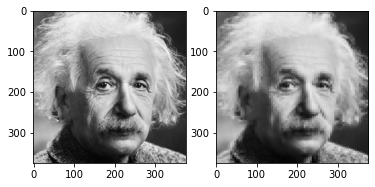

In [575]:
# How accurate is the fixed-point of the collage operator?
# (1) The Neural Collage Operator encoder produces the fractal code for `norm_im`
# (2) The reconstruction is produced as the fixed point of the Collage Operator with the given fractal code
recon = co(norm_im, decode_steps=10)

fig, axs = plt.subplots(1, 2)
axs[0].imshow(norm_im[0].permute(1,2,0), cmap='bone')
axs[1].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')

In [589]:
_, fractal_weight, fractal_bias = co(norm_im, decode_steps=10, return_co_code=True)

# How many bytes to save the fractal code?
size_fractal_code = ( torch.numel(fractal_weight) + torch.numel(fractal_bias) )
raw_img_size = torch.numel(im)

print(f'Size fractal code / size of raw image: {size_fractal_code / raw_img_size}')

# For experts of image compression:
# In the full paper, we use additional strategies to further optimize the code length of fractal codes for Neural Collage Operators used as compressors.
# One such strategy involves L2-regularization on fractal weights to shrink their range, and thus enable efficient bit packing. 

# As a rule of thumb, the simplest compression codec based on Neural Collage Operators is expected to have higher compression ratios (e.g, PSNR / bits per dim)
# than comparable fractal compression and neural implicit compressors (COIN), with slightly less efficiency at medium and high bits per dim compared to block DCT-II. 
# 
# It is also much faster than fractal compression and COIN during encoding. Yet, there is still much room for improvement!

Size fractal code / size of raw image: 0.12


### Why `fractal`?

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 3, 375, 375]) torch.Size([1, 3, 1500, 1500])


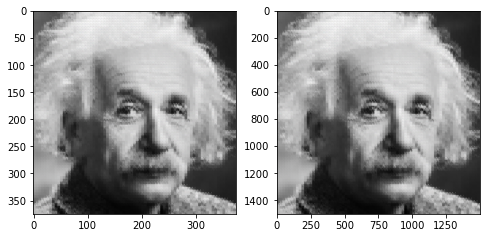

In [595]:
# An interesting properties of Collage Operators (and hence Neural Collage Operators) is the ability to decode, given a fractal code, at any resolution.
# For practicality, our implementation is restricted to resolutions that are multiples of the original image resolution.
# This "super resolution factor" can be passed as `superres_factor`

# Let us decode at 4 times the original 375 x 375 resolution... 
recon_sup = co(norm_im, decode_steps=10, superres_factor=4)
print(norm_im.shape, recon_sup.shape)
fig, axs = plt.subplots(1, 2, figsize=(8, 8))
axs[0].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')
axs[1].imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')

# So far nothing unexpected...

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


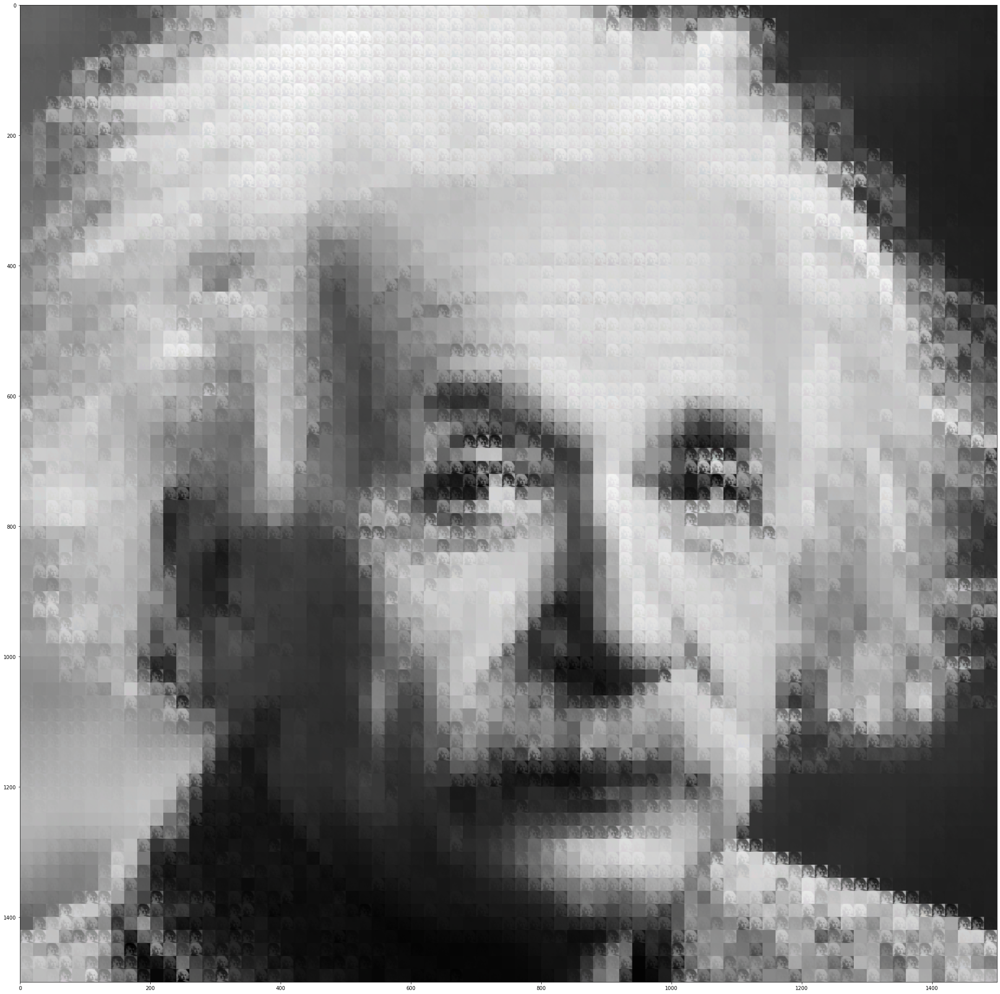

In [594]:
# Enhance!
plt.figure(figsize=(36,36))
plt.imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')

In [596]:
# Wait, what just happened? Einstein made of Einsteins?

# The example above serves as a showcase of the "fractalness" of fractal code representations produced by a Neural Collage Operator.
# Similar data appearing at different scales!
 
# The additional visual details introduced by decoding at higher resolutions are based on the image itself.
#  It is even possible to see multiple levels when decoding at larger resolutions (see Figure 1 and Figure 13 in the paper). 

### Doing the same, but with augmentations

In [5]:
co = NeuralCollageOperator2d(out_res=375, out_channels=3, rh=5, rw=5, dh=375, dw=375, use_augmentations=True)

opt = torch.optim.Adam(co.parameters(), lr=1e-2)
objective = nn.MSELoss()
norm_im = im.float() / 255

for k in range(200):
    recon = co(norm_im, decode_steps=10, return_co_code=False)
    loss = objective(recon, norm_im)
    print(f'Reconstruction MSE: {loss}', end='\r')
    loss.backward()
    opt.step()
    opt.zero_grad()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 3, 375, 375]) torch.Size([1, 3, 1500, 1500])


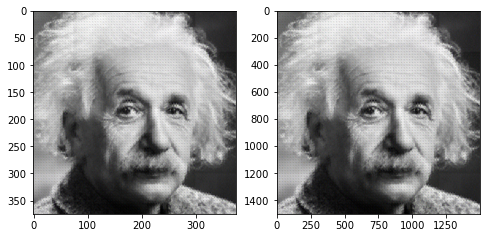

In [6]:
recon = co(norm_im, decode_steps=10)
recon_sup = co(norm_im, decode_steps=10, superres_factor=4)

print(norm_im.shape, recon_sup.shape)
fig, axs = plt.subplots(1, 2, figsize=(8, 8))
axs[0].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')
axs[1].imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')

# Larger, and also slightly sharper...

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


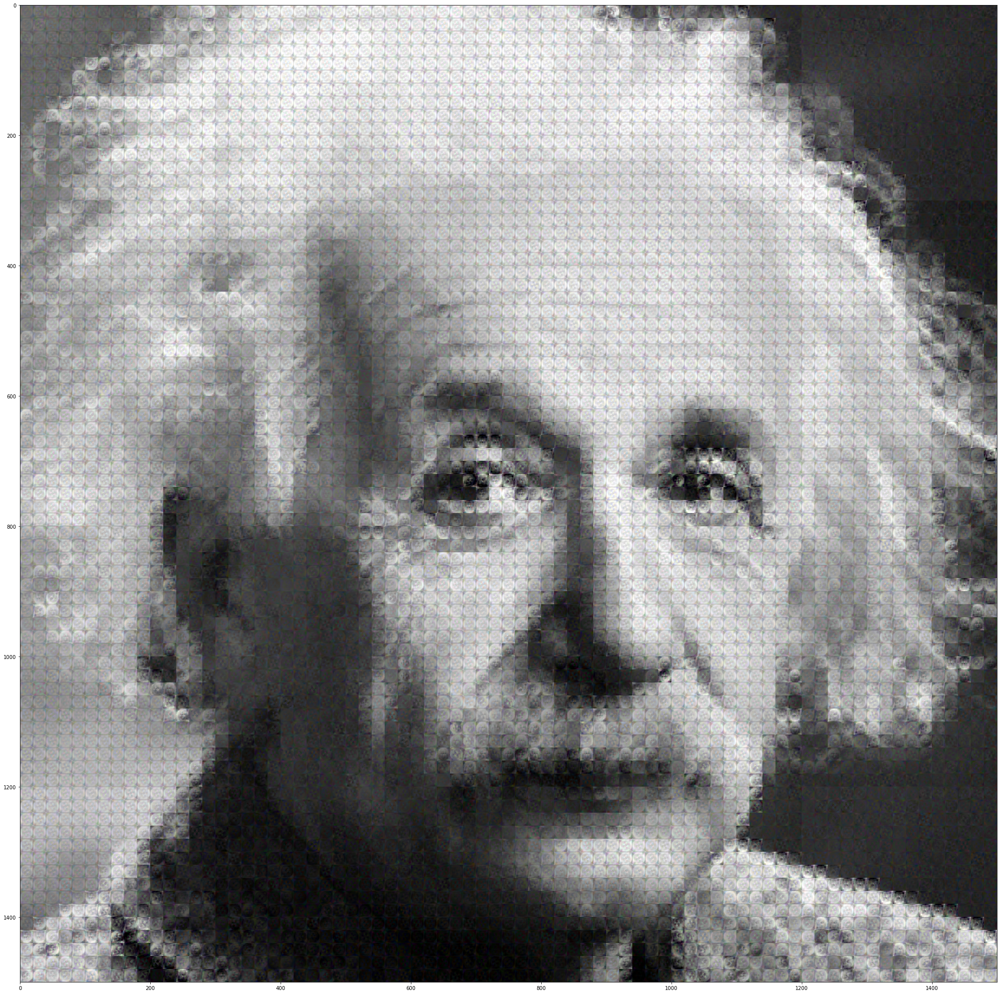

In [7]:
# Enhance! Einstein made of rotations and flips of Einsteins?
plt.figure(figsize=(36,36))
plt.imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')